# Group Analysis Block-Design 10 ROIs

## Study design

This study was performed at the Berlin Ultrahigh Field Facility (B.U.F.F.) and involved a ON/OFF heat stimulation paradigm where 44 seconds of rest was alternated with 44 seconds of heat stimulation. Each stimulation block consisted of 20 heat pulses delivered through an electrode connected to the left arm of the subjects. The pulse duration was matched to the TR (2.2s), in that one pulse per TR was delivered. 

## Load in packages

In [1]:
import nideconv as nd
import os, json
import pandas as pd
import glob
import scipy as sp
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns


# This makes sure I can import some of my own functions
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from linescanning.bin.utils.utils import errorfill, hrf_figure,format_graph

## Set paths and variables

In [9]:
# Define path to timecourse file (onset file was located elsewhere so we need to change that path as well)
# See "Process the onset file" for the onset file
data_dir = '/mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/tc_1cope_allPMmasks'

# for file_path in Path(data_dir).glob('tmp_*.txt'):
#     print(file_path) # do whatever you need with these files

all_files = glob.glob(data_dir + "/dBOLD_*.txt")


# df.head()
li = []
ROIs = []
n_ROI = 10
TR = 2.2
n_subjects = 5
n_runs = 1
n_trial = 5
volumes=220
run_duration = TR*volumes
frametimes = np.arange(0, run_duration, TR)
all_onsets = []
sample_rate = 1/TR

In [10]:
physio_dir = '/mnt/d/FSL/shared/buff/pipeline_params/Bold_H1c/logs/TAPAS_output'
from scipy.io import loadmat

data = []
o = 0
for i in os.listdir(physio_dir):

    if "bfmc" in i and i.endswith(".mat"):

        o += 1

        f = loadmat(os.path.join(physio_dir,i), struct_as_record=False, squeeze_me=True)
        g = f['physio']
        hr = pd.DataFrame(g.ons_secs.hr, columns=[o])

        data.append(hr)

full_df = pd.concat(data, axis=1)

In [11]:
mean_df = full_df.mean(axis = 1, skipna = True)
sem_df = full_df.sem(axis = 1, skipna = True)
df = pd.concat([full_df, mean_df, sem_df], axis=1)
df.columns = [[i for i in np.arange(1,o+1)] + ['mean'] + ['sem']]

In [12]:
df.head()

,1,2,3,4,mean,sem
0,58.482569,54.787126,46.088245,58.120310,54.369562,2.882989
1,58.646386,54.954671,53.001481,59.105399,56.426984,1.472001
2,58.976788,54.787126,55.447704,59.952182,57.290950,1.277722
3,57.996564,54.455083,55.618839,59.952182,57.005667,1.227891
4,58.646386,53.802926,55.618839,59.610574,56.919681,1.342534


In [13]:
bold = []
o = 0
for i in os.listdir(physio_dir):

    if "sub-" in i and i.endswith("partial.txt"):

        o += 1

        f = np.loadtxt(os.path.join(physio_dir,i))
        perc = f*100/np.mean(f)-100
        perc = pd.DataFrame(perc, columns=[o])
        bold.append(perc)

bold_df = pd.concat(bold, axis=1)
bold_df

mean_df = bold_df.mean(axis = 1, skipna = True)
sem_df = bold_df.sem(axis = 1, skipna = True)
b_df = pd.concat([bold_df, mean_df, sem_df], axis=1)
b_df.columns = [[i for i in np.arange(1,o+1)] + ['mean'] + ['sem']]
b_df.head()

,1,2,3,4,5,mean,sem
0,-0.415965,0.726988,1.355881,-0.153171,0.765530,0.455853,0.324842
1,-0.527109,-0.008807,0.462195,-0.265091,-2.233825,-0.514528,0.459788
2,-0.304802,-0.436507,-0.140924,-0.116482,-2.742707,-0.748284,0.501979
3,-0.102110,-0.642203,-0.130163,-0.394285,-2.669793,-0.787711,0.480656
4,-0.055101,-0.089880,-0.050705,-0.163821,-2.647163,-0.601334,0.511858


In [14]:
x = list(TR*np.arange(df.shape[0]))
xcoords = list([TR*np.arange(20,40), TR*np.arange(60,80), TR*np.arange(100,120), TR*np.arange(140,160), TR*np.arange(180,200)])
xcoords = np.concatenate(xcoords).ravel()
# xcoords

(-24.090000000000003, 505.89, -1.920218290151582, 2.485824116908263)

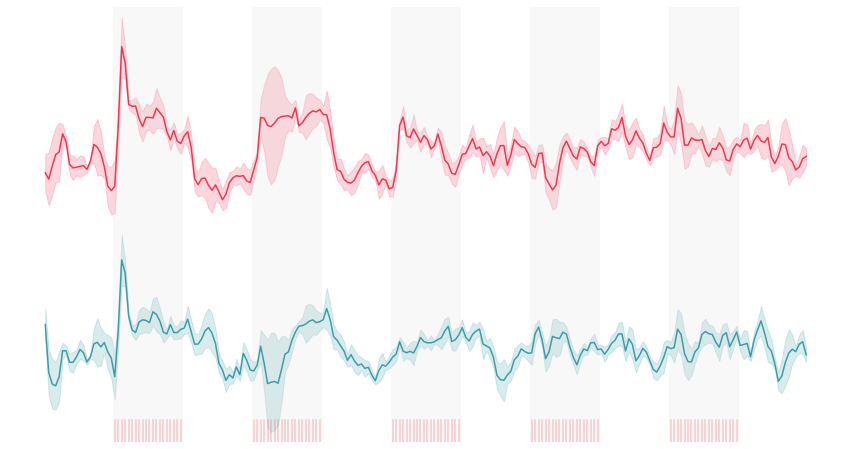

In [15]:
# plt.plot(df['mean'])
import matplotlib.gridspec as gridspec

# Create figure and grid
fig = plt.figure(figsize=(15,8) )
gs1 = gridspec.GridSpec(2,1)
gs1.update(wspace=0.4, hspace=0) # set the spacing between axes.

# plot bold
p = fig.add_subplot(gs1[0])
errorfill(x, b_df.values[:,0], b_df.values[:,o+1],  color='#F33551', alpha_fill=0.2)

# plot stim blocks first subplot
start = 43 # indexing starts at 0
for i in range(1,6):
    rect = patches.Rectangle((start,p.axes.get_ylim()[0]),44,abs(p.axes.get_ylim()[0])+p.axes.get_ylim()[1],linewidth=1,edgecolor=None,facecolor='#DCDCDC', alpha=0.2)
    p.add_patch(rect)
    start += 88
format_graph()

# plot the heart rate
g = fig.add_subplot(gs1[1], sharex=p)
errorfill(x, b_df.values[:,o], b_df.values[:,o+1],  color='#3C9DA7', alpha_fill=0.2)
format_graph()

# plot stim blocks second subplot
start = 43 # indexing starts at 0
for i in range(1,6):
    rect = patches.Rectangle((start,g.axes.get_ylim()[0]),44,abs(g.axes.get_ylim()[0])+g.axes.get_ylim()[1],linewidth=1,edgecolor=None,facecolor='#DCDCDC', alpha=0.2)
    g.add_patch(rect)
    start += 88

# plot tiny stim bars below
for b in xcoords:
    plt.axvline(x=b, alpha=0.2, color='red', ymax=0.1)

p.axis('off')
g.axis('off')

# plt.savefig(os.path.join(physio_dir, 'avg_bold_and_hr.png'), transparent=True)

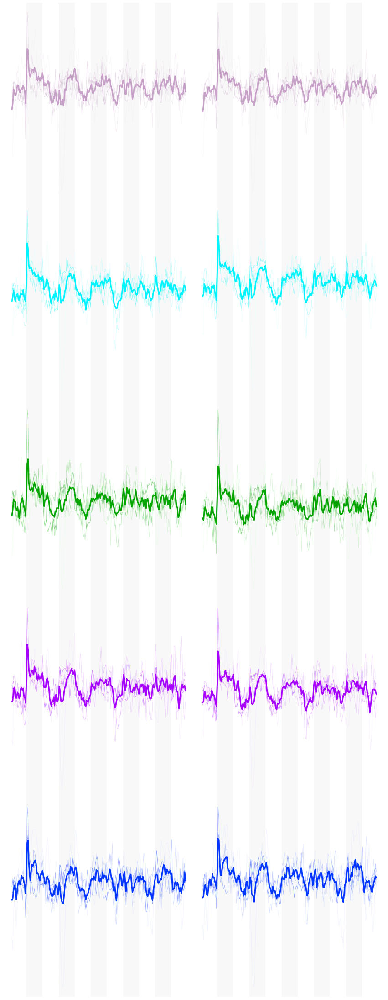

In [16]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import seaborn as sns
import pandas as pd
import os

tc_dir = '/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fsl_feat/MNI152NLin6Asym/level2/fixed_thres-3.1_space-MNI152NLin6Asym.gfeat/cope1.feat/timecourses'
all_files = glob.glob(tc_dir + "/*timecourse.txt")
nr_subject = 5
TR = 2.2
fig = plt.figure(figsize=(15,40))
gs1 = gridspec.GridSpec(nr_subject,2)
gs1.update(wspace=0, hspace=0) # set the spacing between axes.

# drop first 3 volumes
drop = 3
step = 0
bold = []

for f in all_files:

    df = []
    tmp = []
    data = np.loadtxt(f)

    if "S1" in os.path.basename(f):
        color = (5/255, 165/255, 0)
        roi="S1"
    elif "S2" in os.path.basename(f):
        color = (166/255,0/255,255/255)
        roi="S2"
    elif "INS" in os.path.basename(f):
        color = (0/255,243/255,255/255)
        roi="INS"
    elif "ACC" in os.path.basename(f):
        color = (199/255,160/255,199/255)
        roi="ACC"
    elif "Tha" in os.path.basename(f):
        color = (0/255,54/255,255/255)
        roi="Tha"
    else:
        raise ValueError(f'could not find any of the ROIs in the filename')

    # convert to percent signal change
    for i in np.arange(0,nr_subject):
        perc = data[drop:,i]*100/np.mean(data[drop:,i])-100
        perc = pd.DataFrame(perc, columns=[i+1])
        tmp.append(perc)

    t = pd.concat(tmp, axis=1)
    mean_df = t.mean(axis = 1, skipna = True)
    sem_df = t.sem(axis = 1, skipna = True)
    b_df = pd.concat([t, mean_df, sem_df], axis=1)
    b_df.columns = [[s+1 for s in np.arange(nr_subject)] + ['mean'] + ['sem']]
    b_df['roi'] = roi
    df.append(b_df)

    color = sns.light_palette(color, nr_subject+1)
    
    x = list(TR*np.arange(data.shape[0]-drop))

    # This can be done cleaner, but I'm lazy
    xcoords = list([TR*np.arange(20-drop,40-drop), 
                    TR*np.arange(60-drop,80-drop), 
                    TR*np.arange(100-drop,120-drop), 
                    TR*np.arange(140-drop,160-drop), 
                    TR*np.arange(180-drop,200-drop)])

    xcoords = np.concatenate(xcoords).ravel()

    m = nr_subject+1
    for i in np.arange(0,m):
        # plt.figure()
        a = fig.add_subplot(gs1[step]) # plot mean as thick line
        if i == nr_subject:
            a.plot(x,b_df.values[:,i], color=color[i], linewidth=3)
        else:
            a.plot(x,b_df.values[:,i], color=color[i], linewidth=1, alpha=0.5)

    # plot stim blocks first subplot
    start = 43-drop # indexing starts at 0
    for i in range(1,6):
        rect = patches.Rectangle((start,a.axes.get_ylim()[0]),44,abs(a.axes.get_ylim()[0])+a.axes.get_ylim()[1],linewidth=1,edgecolor=None,facecolor='#DCDCDC', alpha=0.2)
        a.add_patch(rect)
        start += 88
    
    format_graph()

    step += 1

    a.axis('off')
    
    
    plt.savefig(os.path.join(tc_dir, 'fig3c_mean+subjects.png'), transparent=True)



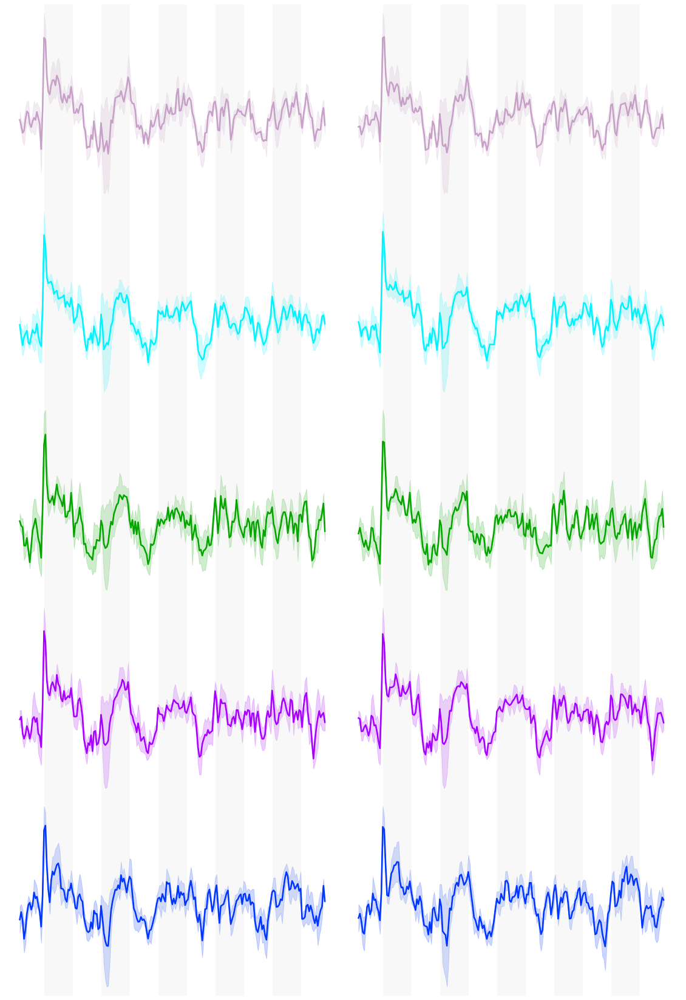

In [17]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import seaborn as sns
import pandas as pd
import os

tc_dir = '/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fsl_feat/MNI152NLin6Asym/level2/fixed_thres-3.1_space-MNI152NLin6Asym.gfeat/cope1.feat/timecourses'
all_files = glob.glob(tc_dir + "/*timecourse.txt")
nr_subject = 5
TR = 2.2
fig = plt.figure(figsize=(20,30))
gs1 = gridspec.GridSpec(nr_subject,2)
gs1.update(wspace=0, hspace=0) # set the spacing between axes.

# drop first 3 volumes
drop = 5
step = 0
bold = []

for f in all_files:

    df = []
    tmp = []
    data = np.loadtxt(f)

    if "S1" in os.path.basename(f):
        color = (5/255, 165/255, 0)
        roi="S1"
    elif "S2" in os.path.basename(f):
        color = (166/255,0/255,255/255)
        roi="S2"
    elif "INS" in os.path.basename(f):
        color = (0/255,243/255,255/255)
        roi="INS"
    elif "ACC" in os.path.basename(f):
        color = (199/255,160/255,199/255)
        roi="ACC"
    elif "Tha" in os.path.basename(f):
        color = (0/255,54/255,255/255)
        roi="Tha"
    else:
        raise ValueError(f'could not find any of the ROIs in the filename')

    # convert to percent signal change
    for i in np.arange(0,nr_subject):
        perc = data[drop:,i]*100/np.mean(data[drop:,i])-100
        perc = pd.DataFrame(perc, columns=[i+1])
        tmp.append(perc)

    t = pd.concat(tmp, axis=1)
    mean_df = t.mean(axis=1, skipna=True)
    sem_df = t.sem(axis=1, skipna=True)
    b_df = pd.concat([t, mean_df, sem_df], axis=1)
    b_df.columns = [[s+1 for s in np.arange(nr_subject)] + ['mean'] + ['sem']]
    b_df['roi'] = roi
    df.append(b_df)

    # color = sns.light_palette(color, nr_subject+1)
    
    x = list(TR*np.arange(data.shape[0]-drop))

    # This can be done cleaner, but I'm lazy
    xcoords = list([TR*np.arange(20-drop,40-drop), 
                    TR*np.arange(60-drop,80-drop), 
                    TR*np.arange(100-drop,120-drop), 
                    TR*np.arange(140-drop,160-drop), 
                    TR*np.arange(180-drop,200-drop)])

    xcoords = np.concatenate(xcoords).ravel()

    a = fig.add_subplot(gs1[step], sharex=a) # plot mean as thick line

    a.plot(x,b_df.values[:,nr_subject].astype(float), color=color, linewidth=2.5)
    errorfill(x, b_df.values[:,nr_subject].astype(float), b_df.values[:,nr_subject+1].astype(float), color=color, alpha_fill=0.2)

    # plot stim blocks first subplot
    start = 43-drop # indexing starts at 0
    for i in range(1,6):
        rect = patches.Rectangle((start,a.axes.get_ylim()[0]),44,abs(a.axes.get_ylim()[0])+a.axes.get_ylim()[1],linewidth=1,edgecolor=None,facecolor='#DCDCDC', alpha=0.2)
        a.add_patch(rect)
        start += 88
    
    format_graph()

    step += 1

    a.axis('off')

plt.savefig(os.path.join(tc_dir, 'fig3c_mean+sem.png'), transparent=True)



In [18]:
x.dtype

AttributeError: 'list' object has no attribute 'dtype'

In [ ]:
b_df.head(10)

## Load in text files and sort based on subject

In [182]:
    new = []
    ROIs = ['ACC_L', 'ACC_R', 'INS_L', 'INS_R', 'S1_L', 'S1_R', 'S2_L', 'S2_R', 'Tha_L', 'Tha_R']
    onsets = []

    ft_dir = '/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fsl_feat/MNI152NLin6Asym/level1'
    for i in np.arange(1,6):


        tc_dir = os.path.join(ft_dir, f'sub-00{i}.feat', 'cluster_x_roi', 'fixed_thres-3.1_space-MNI152NLin6Asym.gfeat', 'timecourses')
        # these text files have fslmeats data from each ROI in one column, so we need to cut every 220 rows and stores that in an array, which is       what that np.reshape is doing
        f = np.loadtxt(os.path.join(tc_dir, f'sub-00{i}_desc-all_rois.txt'))
        h = np.loadtxt(os.path.join(tc_dir, f'sub-00{i}_desc-all_rois_hd.txt'), dtype='str')

        # Create dataframe
        tmp_df = pd.DataFrame(f, columns=h)

        # Additional information for indexing such as subject ID, run ID (we only have 1, but still), and TRs
        tmp_df['subject'] = i
        tmp_df['run'] = 1
        tmp_df['t'] = list(TR*np.arange(fn.shape[-1]))

        # Add dataframe to overall dataframe
        new.append(tmp_df)

        # load onset file
        tmp_onsets = pd.read_csv('/mnt/d/FSL/shared/buff/pipeline_params/Bold_H1c/logs/pain_timings.txt', sep="   ", usecols=[0], header=None, engine='python')

        # Do some indexing on the onset dataframe
        tmp_onsets.columns = ["onset"]
        tmp_onsets['event_type'], tmp_onsets['subject'], tmp_onsets['run'] = 'heat', i, 1

        # Add dataframe to overall onset dataframe 
        onsets.append(tmp_onsets)

    # Concatenate all tmp dataframes created in the loop to have all subjects in the same dataframe (which is very nice)
    data_tc = pd.concat(new).set_index(['subject', 'run', 't'])
    data_onsets = pd.concat(onsets).set_index(['subject', 'run', 'event_type'])

In [192]:
tmp_df.shape

(220, 26)

In [55]:
# new = []
# ROIs = ['ACC_L', 'ACC_R', 'INS_L', 'INS_R', 'S1_L', 'S1_R', 'S2_L', 'S2_R', 'Tha_L', 'Tha_R']
# onsets = []

# for i in np.arange(1,6):
    
#     # these text files have fslmeats data from each ROI in one column, so we need to cut every 220 rows and stores that in an array, which is       what that np.reshape is doing
#     f = np.loadtxt(os.path.join(data_dir, f'sub-00{i}.txt'))
#     fn = np.reshape(f, (-1,220))

#     # Create dataframe
#     tmp_df = pd.DataFrame(fn)

#     # Store the ROI-names in the dataframe 
#     tmp_df.index = pd.Index(ROIs)

#     # Dataframe above has TRs as columns, transpose to have ROIs as columns and TRs on the rows
#     tmp_df = tmp_df.T

#     # Additional information for indexing such as subject ID, run ID (we only have 1, but still), and TRs
#     tmp_df['subject'] = i
#     tmp_df['run'] = 1
#     tmp_df['t'] = list(TR*np.arange(fn.shape[-1]))

#     # Add dataframe to overall dataframe
#     new.append(tmp_df)


#     # load onset file
#     tmp_onsets = pd.read_csv('/mnt/d/FSL/shared/buff/pipeline_params/Bold_H1c/logs/pain_timings.txt', sep="   ", usecols=[0], header=None, engine='python')

#     # Do some indexing on the onset dataframe
#     tmp_onsets.columns = ["onset"]
#     tmp_onsets['event_type'], tmp_onsets['subject'], tmp_onsets['run'] = 'heat', i, 1

#     # Add dataframe to overall onset dataframe 
#     onsets.append(tmp_onsets)

# # Concatenate all tmp dataframes created in the loop to have all subjects in the same dataframe (which is very nice)
# data_tc = pd.concat(new).set_index(['subject', 'run', 't'])
# data_onsets = pd.concat(onsets).set_index(['subject', 'run', 'event_type'])

In [56]:
# Check if timeseries data is indexed correctly
data_tc.head(100)

FMG_R         V1_L       Clau_R         S1_L  \
subject run t                                                          
1       1   0.0   11441.75533  13139.46525  11506.23111  12037.75543   
            2.2   11437.66786  13114.85955  11493.88027  12046.53891   
            4.4   11432.99560  13177.44000  11518.11121  12060.98329   
            6.6   11425.74264  13198.64755  11522.64881  12093.21095   
            8.8   11496.99120  13162.62967  11520.62139  12119.92474   
            11.0  11540.39320  13249.79480  11549.34161  12109.63108   
            13.2  11515.85186  13262.51828  11511.60129  12067.55929   
            15.4  11490.36554  13238.99825  11514.79531  12030.41624   
            17.6  11472.78762  13256.76299  11505.93824  12009.82719   
            19.8  11486.97464  13235.95084  11517.88485  12025.97314   
            22.0  11486.61711  13284.38055  11519.89038  12016.70410   
            24.2  11511.86920  13271.15217  11519.62443  12034.94337   
            26.4  11472.80969  13220.81916  11514.73305  12040.01589   
            28.6  11427.38996  13213.75392  11490.80526  12051.75031   
            30.8  11485.97445  13215.86261  11538.27771  12085.24478   
            33.0  11503.32433  13256.93323  11526.99764  12103.35618   
            35.2  11500.49025  13237.03281  11528.19141  12066.36620   
            37.4  11499.34982  13223.13513  11505.71842  12037.57747   
            39.6  11470.38788  13227.21425  11472.34737  12032.00478   
            41.8  11475.18385  13193.97742  11461.00950  12018.32649   

                        ACC_R        Tha_R        rol_L         S1_R  \
subject run t                                                          
1       1   0.0   11276.51843  7308.420697  12115.73287  15752.96630   
            2.2   11245.42483  7297.644060  12127.57938  15757.84614   
            4.4   11267.11355  7291.933015  12161.08570  15785.88895   
            6.6   11267.19469  7302.594071  12172.22621  15833.17753   
            8.8   11269.78268  7313.322722  12155.88859  15824.32879   
            11.0  11351.90215  7357.108817  12154.25570  15886.79017   
            13.2  11359.94397  7343.404863  12114.57238  15873.52367   
            15.4  11343.11477  7341.325776  12073.22762  15810.34353   
            17.6  11318.53629  7296.418866  12065.79911  15769.16561   
            19.8  11341.51782  7313.441577  12071.00157  15758.14091   
            22.0  11317.19017  7306.746136  12089.56221  15776.29400   
            24.2  11284.99671  7341.668585  12073.15686  15794.90189   
            26.4  11252.29028  7336.070455  12081.13049  15782.90096   
            28.6  11260.28561  7305.493615  12104.99595  15814.61833   
            30.8  11319.05345  7338.179884  12157.95433  15877.02908   
            33.0  11332.12398  7324.564402  12149.18863  15879.42557   
            35.2  11317.73915  7314.139065  12126.54783  15846.07011   
            37.4  11297.37630  7309.760090  12091.97564  15800.76295   
            39.6  11262.58175  7313.118754  12044.38427  15751.52904   
            41.8  11254.00663  7296.614887  12019.73960  15735.06507   

                        FIG_L        AMY_R  ...        ACC_L        Tha_L  \
subject run t                               ...                             
1       1   0.0   14727.98784  5289.621828  ...  11311.53380  6712.690029   
            2.2   14663.35779  5327.418766  ...  11280.28889  6686.303110   
            4.4   14704.22511  5346.695312  ...  11305.77519  6689.641246   
            6.6   14825.34312  5380.433153  ...  11293.84593  6705.475381   
            8.8   14893.86413  5311.048680  ...  11303.74728  6702.549918   
            11.0  14821.72798  5394.441218  ...  11376.96343  6746.766043   
            13.2  14648.21643  5250.362869  ...  11376.72533  6740.067247   
            15.4  14560.33447  5315.124124  ...  11345.28607  6737.721712   
            17.6  14542.05922  5320.863120  ...  11340.68440  6707.113413   
       

In [69]:
onset = 20
start = onset-2
stop = (start+20)+5

sub_df = data_tc.reset_index()
sub_001 = sub_df[(sub_df['subject'] == 1)]
sub_001 = sub_001[start:stop]
sub_001.head(20)

sub_003 = sub_df[(sub_df['subject'] == 3)]

In [120]:
from scipy.signal import savgol_filter
from scipy.interpolate import splrep, splev
lh_acc = sub_003['ACC_L']
lh_acc.shape

(220,)

In [126]:
perc = lh_acc*100/np.mean(lh_acc)-100
perc

440    2.073314
441    1.009202
442   -0.221027
443   -0.312298
444   -0.157786
         ...   
655   -0.284994
656   -0.578114
657    0.427348
658    0.830630
659    0.071111
Name: ACC_L, Length: 220, dtype: float64

In [173]:
bl = []
sem = []
onset = 20
nr_blocks = 5
fc = 4

perc = lh_acc*100/np.mean(lh_acc)-100
perc = pd.DataFrame(perc)
for i in np.arange(0,nr_blocks):

    start = onset-fc
    stop = (start+20)+2*fc

    # print(f'start = {start}; end = {stop}')
    
    b_tc = pd.DataFrame(perc[start:stop])
    bl.append(b_tc)

    onset += 40

t = pd.concat(bl).to_numpy()
tn = np.reshape(t, (stop-start, -1))
t = pd.DataFrame(tn)
sem_df = t.sem(axis=1, skipna=True)
b_df = pd.concat([t, sem_df], axis=1)
b_df.columns = [[s+1 for s in np.arange(nr_blocks)] + ['sem']]
b_df

,1,2,3,4,5,sem
0,-0.919173,-0.097891,-0.088834,-0.458848,-2.544439,0.456617
1,0.415719,3.650385,2.903602,0.904308,0.343353,0.684094
2,-0.040767,-0.158847,0.093111,0.106072,-0.259383,0.070920
3,0.090655,-0.375044,-0.611315,-0.403759,0.326473,0.173615
4,0.709898,0.226913,0.237271,0.347325,0.372027,0.087682
5,0.509802,0.129933,-0.189565,-0.122502,0.826132,0.192869
6,-0.338031,-0.975355,-0.622837,-0.626167,0.646254,0.276489
7,0.087580,-0.121734,0.483953,0.335157,-0.522163,0.177182
8,0.006540,0.358066,-0.938827,-0.687975,0.017790,0.242236
9,0.918081,0.724216,0.096360,-0.077714,-0.398130,0.247210


In [175]:
x = list(TR*np.arange(-fc,20+fc))
x

[-8.8,
 -6.6000000000000005,
 -4.4,
 -2.2,
 0.0,
 2.2,
 4.4,
 6.6000000000000005,
 8.8,
 11.0,
 13.200000000000001,
 15.400000000000002,
 17.6,
 19.8,
 22.0,
 24.200000000000003,
 26.400000000000002,
 28.6,
 30.800000000000004,
 33.0,
 35.2,
 37.400000000000006,
 39.6,
 41.800000000000004,
 44.0,
 46.2,
 48.400000000000006,
 50.6]

In [176]:
b_df.values[:,0].shape

(28,)

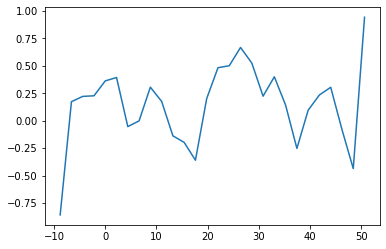

In [178]:
fl_acc = savgol_filter(b_df.values[:,0].astype(float), 9, 5)
plt.plot(x,fl_acc)
# plt.plot(x,b_df.values[:,0])
plt.show()

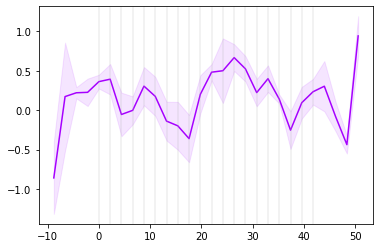

In [180]:
plt.figure()
# bspl = splrep(x,lh_acc,s=3)
# bspl_y = splev(x,bspl)
# # plt.plot(x,lh_acc)
errorfill(x, fl_acc, b_df.values[:,-1], color=(166/255, 0, 255/255), alpha_fill=0.1)

xcoords = list(TR*np.arange(0,20))

for xc in xcoords:
    plt.axvline(x=xc, alpha=0.2, color='darkgray')

# plt.axis('off')
plt.show()


In [186]:
def hrf_figure(x,y,color=None,order=3,stim_bars=None, alpha_error=0.1, alpha_bars=0.3, error_val=0.2, fig_save=None, title=None):

    from scipy.interpolate import splrep, splev
    import numpy as np
    import matplotlib.pyplot as plt

    plt.figure()
    bspl = splrep(x,y,s=1)
    bspl_y = splev(x,bspl)
    errorfill(x, bspl_y, error_val,  color=color, alpha_fill=alpha_error)

    if stim_bars is not None:
        for b in stim_bars:
            plt.axvline(x=b, alpha=0.2, color='darkgray')

    plt.axis('off')

    if title is not None:
        plt.title(title)

    if fig_save is not None:
        plt.savefig(fig_save, transparent=True)
    else:
        plt.show()

In [190]:
# %matplotlib inline
# This thing can draw HRF figures similar to the ones we already had for new figure 1, but now with slightly less interpolation. Some have beautiful HRFs, while other don't; same as before.
from linescanning.bin.utils.utils import hrf_figure

# Filter can be savgol or splrep!
filter_type = 'savgol'
png_dir = f'/mnt/d/FSL/shared/buff/pipeline_data/H01/code/figures/fig4/hrfs'
nr_blocks = 5

if not os.path.exists(png_dir):
    os.mkdir(png_dir)

ROIs = ['ACC_L', 'ACC_R', 'INS_L', 'INS_R',	'S1_L', 'S1_R',	'S2_L',	'S2_R',	'Tha_L', 'Tha_R']
onset = 20
start = onset-5
stop = (start+20)+5

if not os.path.exists(png_dir):
    os.mkdir(png_dir)

for s in np.arange(1,6):

    print(f"\n------------------- sub-00{s} -------------------")
    sub_df = data_tc.reset_index()
    sub_df = sub_df[(sub_df['subject'] == s)]

    # where to draw the little stimulation lines
    xcoords = list(TR*np.arange(0,20))

    for i in ROIs:

        # assign color (same as earlier figures)
        if "S1" in i:
            color = (5/255, 165/255, 0)
        elif "S2" in i:
            color = (166/255, 0, 255/255)
        elif "ACC" in i:
            color = (199/255, 160/255, 199/255)
        elif "INS" in i:
            color = (0, 243/255, 255/255)
        elif "Tha" in i:
            color = (0/255, 54/255, 255/255)
            
        
        # Select subject specific dataframe
        data = sub_df[i]

        # This thing calculates the SEM over the blocks
        bl = []
        sem = []
        onset = 20
        nr_blocks = 5
        fc = 4

        # x-values, 4TR's before start stim until 4TR's after last stim
        x = list(TR*np.arange(-fc,20+fc))

        # percentage signal change
        perc = data*100/np.mean(data)-100
        perc = pd.DataFrame(perc)

        # Divide dataframe into the 5 stimulation blocks to calculate SEM
        for f in np.arange(0,nr_blocks):

            start = onset-fc
            stop = (start+20)+2*fc

            # print(f'start = {start}; end = {stop}')
            
            b_tc = pd.DataFrame(perc[start:stop])
            bl.append(b_tc)

            onset += 40

        # Convert 1x140 array to 5x28 array by converting dataframe to numpy array and back
        # Reshaping a numpy array is a bit easier than a dataframe
        t = pd.concat(bl).to_numpy()
        tn = np.reshape(t, (stop-start, -1))
        t = pd.DataFrame(tn)

        # Calculate mean & SEM and add to dataframe (so no we have a 7x28 dataframe; 5 subjects + Mean + SEM column)
        mean_df = t.mean(axis=1, skipna=True)
        sem_df = t.sem(axis=1, skipna=True)
        b_df = pd.concat([t, mean_df, sem_df], axis=1)
        b_df.columns = [[s+1 for s in np.arange(nr_subject)] + ['mean'] + ['sem']]

        # Draw the figure
        # b_df.values[:0] = first column = first block. You can also plot the mean instead, then specify b_df.values[:-2] (second to last column)
        # b_df.values[:,-1] = last column of dataframe = SEM
        
        if not os.path.exists(os.path.join(png_dir, f'sub-00{s}_desc-{i}.png')):
            hrf_figure(x,b_df.values[:,0], color=color, stim_bars=xcoords, error_val=b_df.values[:,-1], fig_save=os.path.join(png_dir, f'sub-00{s}_desc-{i}.png'), filt=filter_type)
            print("  created {file}".format(file=os.path.join(png_dir, f'sub-00{s}_desc-{i}.png')))
        else:
            print(f"  sub-00{s}_desc-{i}.png already exists")


------------------- sub-001 -------------------
  sub-001_desc-ACC_L.png already exists
  sub-001_desc-ACC_R.png already exists
  sub-001_desc-INS_L.png already exists
  sub-001_desc-INS_R.png already exists
  sub-001_desc-S1_L.png already exists
  sub-001_desc-S1_R.png already exists
  sub-001_desc-S2_L.png already exists
  sub-001_desc-S2_R.png already exists
  sub-001_desc-Tha_L.png already exists
  sub-001_desc-Tha_R.png already exists

------------------- sub-002 -------------------
  sub-002_desc-ACC_L.png already exists
  sub-002_desc-ACC_R.png already exists
  sub-002_desc-INS_L.png already exists
  sub-002_desc-INS_R.png already exists
  sub-002_desc-S1_L.png already exists
  sub-002_desc-S1_R.png already exists
  sub-002_desc-S2_L.png already exists
  sub-002_desc-S2_R.png already exists
  sub-002_desc-Tha_L.png already exists
  sub-002_desc-Tha_R.png already exists

------------------- sub-003 -------------------
  sub-003_desc-ACC_L.png already exists
  sub-003_desc-ACC_R.


------------------- sub-001 -------------------
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-ACC_L.png
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-ACC_R.png
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-INS_L.png
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-INS_R.png
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-S1_L.png
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-S1_R.png
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-S2_L.png
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-S2_R.png
  created /mnt/d/FSL/shared/buff/pipeline_data/H1c/bold/processing/pngs_savgol/sub-001_desc-Tha_L.png
  created /mnt/d/FSL/shared/buff/pipe

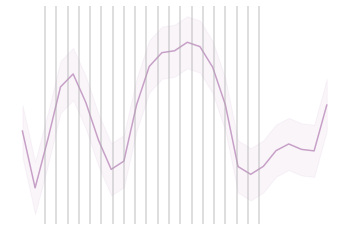

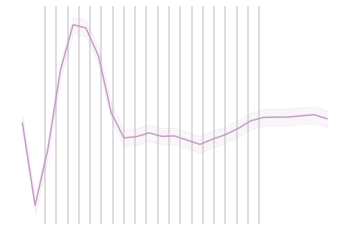

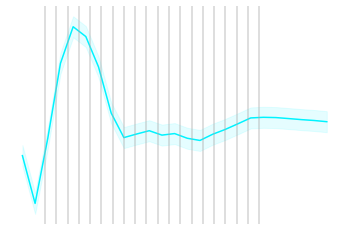

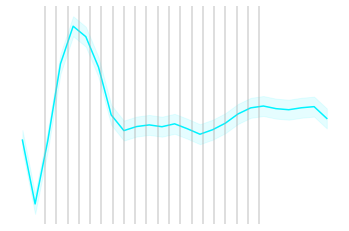

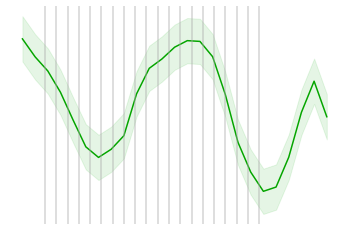

...

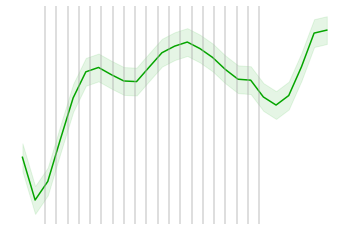

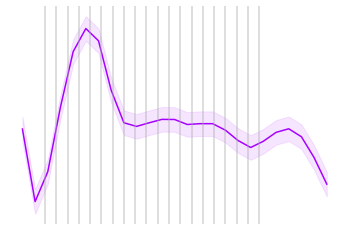

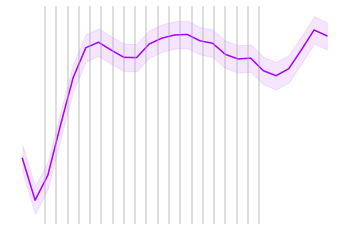

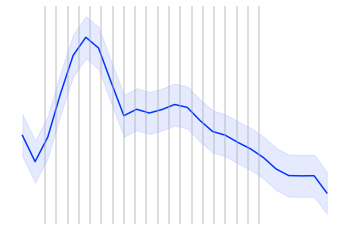

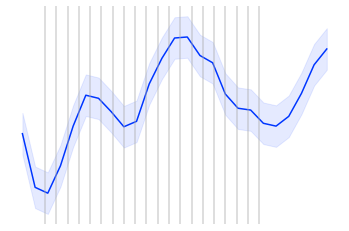

In [11]:
# %matplotlib inline
# This thing can draw HRF figures similar to the ones we already had for new figure 1, but now with slightly less interpolation. Some have beautiful HRFs, while other don't; same as before.
from linescanning.bin.utils.utils import hrf_figure

# Filter can be savgol or splrep!
filter_type = 'savgol'
png_dir = f'/mnt/d/FSL/shared/buff/pipeline_data/H01/code/figures/fig4/hrfs'

if not os.path.exists(png_dir):
    os.mkdir(png_dir)

ROIs = ['ACC_L', 'ACC_R', 'INS_L', 'INS_R',	'S1_L', 'S1_R',	'S2_L',	'S2_R',	'Tha_L', 'Tha_R']
onset = 20
start = onset-5
stop = (start+20)+5

if not os.path.exists(png_dir):
    os.mkdir(png_dir)

for s in np.arange(1,6):

    print(f"\n------------------- sub-00{s} -------------------")
    sub_df = data_tc.reset_index()
    sub_df = sub_df[(sub_df['subject'] == s)]
    sub_df = sub_df[start:stop]

    xcoords = list(TR*np.arange(0,20))
    x = np.linspace((start-onset)*TR, (stop-start)*TR,num=(stop-start))

    for i in ROIs:

        if "S1" in i:
            color = (5/255, 165/255, 0)
        elif "S2" in i:
            color = (166/255, 0, 255/255)
        elif "ACC" in i:
            color = (199/255, 160/255, 199/255)
        elif "INS" in i:
            color = (0, 243/255, 255/255)
        elif "Tha" in i:
            color = (0/255, 54/255, 255/255)
        
        data = sub_df[i]
        hrf_figure(x,data, color=color, stim_bars=xcoords, fig_save=os.path.join(png_dir, f'sub-00{s}_desc-{i}.png'), filt=filter_type)
        print("  created {file}".format(file=os.path.join(png_dir, f'sub-00{s}_desc-{i}.png')))

In [83]:
# Check if onset data is indexed correctly
data_onsets.reset_index()
block1_onsets = data_onsets[(data_onsets['onset'] == 45)]
block2_onsets = data_onsets[(data_onsets['onset'] == 133)]
block3_onsets = data_onsets[(data_onsets['onset'] == 221)]
block4_onsets = data_onsets[(data_onsets['onset'] == 309)]
block5_onsets = data_onsets[(data_onsets['onset'] == 397)]
block1_onsets

,,,onset
subject,run,event_type,
1,1,heat,45
2,1,heat,45
3,1,heat,45
4,1,heat,45
5,1,heat,45


In [95]:
single_onsets = list(TR*np.arange(19,39))

new_onsets = []

for i in range(1,6):

    df_single_onsets = pd.DataFrame(single_onsets, columns=['onset'])
    df_single_onsets['run'] = 1
    df_single_onsets['event_type'] = 'heat'
    df_single_onsets['subject'] = i 

    new_onsets.append(df_single_onsets)

data_onsets_new = pd.concat(new_onsets).set_index(['subject', 'run', 'event_type'])
data_onsets_new

onset
subject run event_type       
1       1   heat        41.99
            heat        44.20
            heat        46.41
            heat        48.62
            heat        50.83
...                       ...
5       1   heat        75.14
            heat        77.35
            heat        79.56
            heat        81.77
            heat        83.98

[100 rows x 1 columns]

## Run the model

In [96]:
## SINGLE EVENTS INSTEAD OF BLOCKS

# We can now use GroupResponseFitter to fit all the subjects with one object
g_model = nd.GroupResponseFitter(data_tc,
                                 data_onsets_new,
                                 input_sample_rate=1,
                                 concatenate_runs=False)

# We use the add_event-method to add the events we are interested in. The GroupResponseFitter then automatically collects the right onset times from the onsets-object. We choose here to use the Fourier-basis set, with 5 regressors.
g_model.add_event('heat',
                  basis_set='fourier',
                  n_regressors=9,
                  interval=[0, 44])



In [97]:
# We can fit all the subjects at once using the fit-method
g_model.fit()

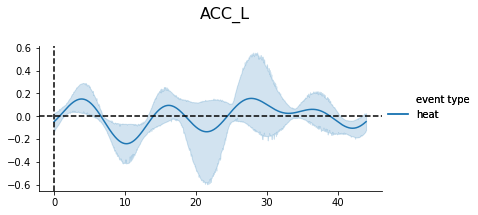

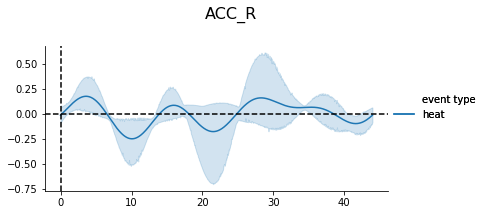

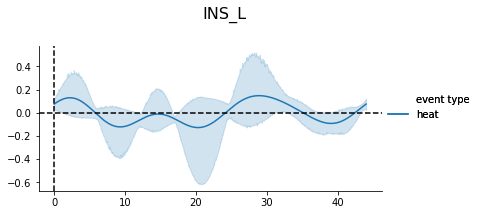

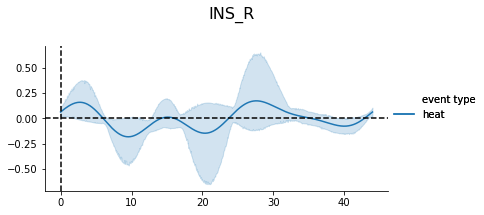

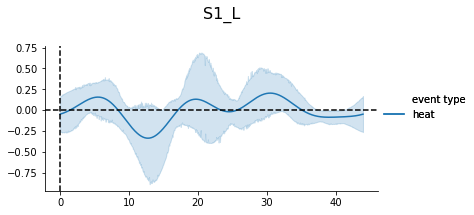

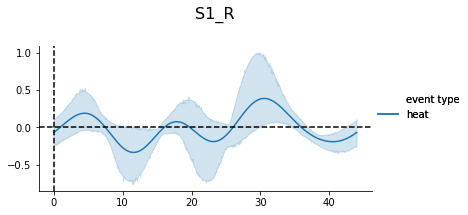

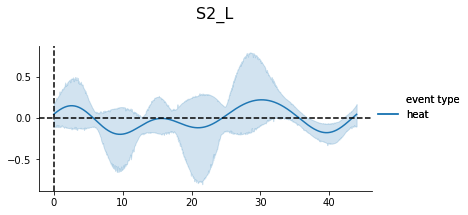

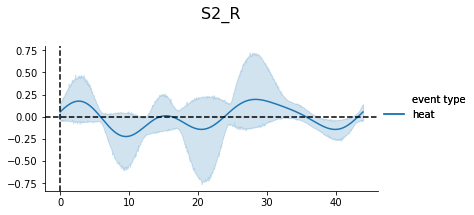

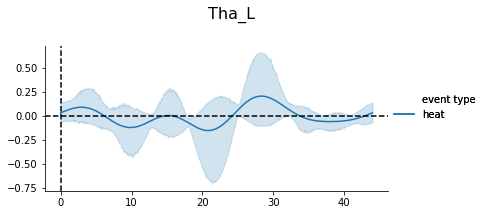

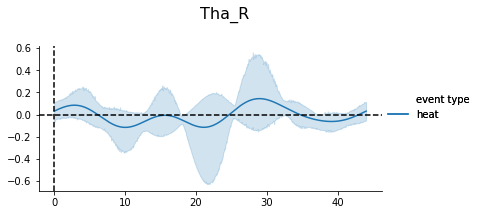

In [98]:
# We can plot the mean timecourse across subjects
g_model.plot_groupwise_timecourses()

In [42]:
# We can now use GroupResponseFitter to fit all the subjects with one object
blocks = []
onsets = [45, 133, 221, 309, 397]

for i in range(1,6):

    onset = data_onsets[(data_onsets['onset'] == onsets[i-1])]

    g_model = nd.GroupResponseFitter(data_tc,
                                    onset,
                                    input_sample_rate=1,
                                    concatenate_runs=False)

    # We use the add_event-method to add the events we are interested in. The GroupResponseFitter then automatically collects the right onset times from the onsets-object. We choose here to use the Fourier-basis set, with 5 regressors.
    g_model.add_event('heat',
                    basis_set='fir',
                    n_regressors=3,
                    interval=[0, 10])

    g_model.fit(type='ridge')

    case = {f'block {i}': g_model}
    blocks.append(case)

Problem with responsefitter {'subject': 1, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 2, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 3, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 4, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 5, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 1, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 2, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 3, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 4, 'run': 1}: No support for multidimensional signals yet
Problem with responsefitter {'subject': 5, 'run': 1}: No support for multidimensional signals yet
Problem with respons

In [20]:
# We can now use GroupResponseFitter to fit all the subjects with one object
g_model = nd.GroupResponseFitter(data_tc,
                                 data_onsets,
                                 input_sample_rate=1,
                                 concatenate_runs=False)

# We use the add_event-method to add the events we are interested in. The GroupResponseFitter then automatically collects the right onset times from the onsets-object. We choose here to use the Fourier-basis set, with 5 regressors.
g_model.add_event('heat',
                  basis_set='fourier',
                  n_regressors=9,
                  interval=[0, 44])



In [23]:
# We can fit all the subjects at once using the fit-method
g_model.fit()

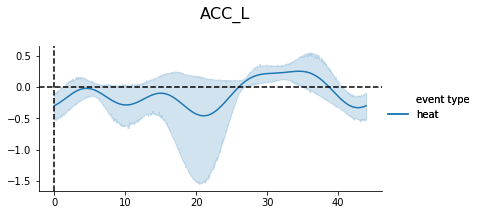

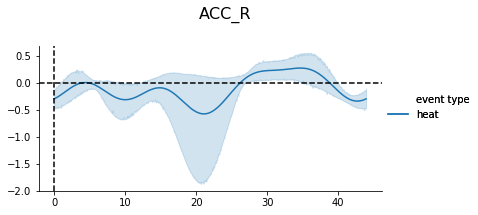

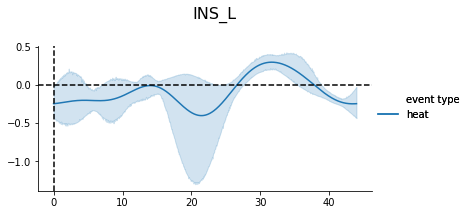

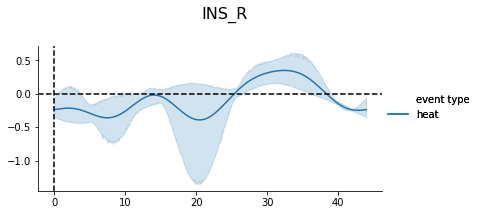

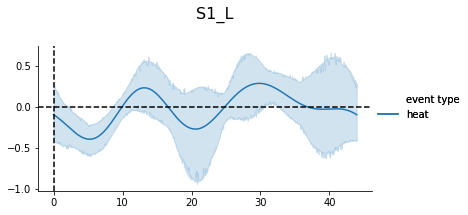

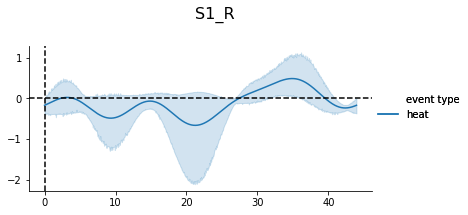

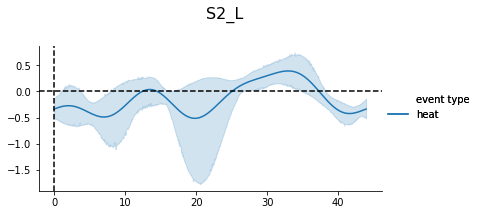

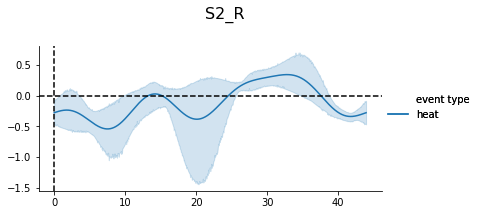

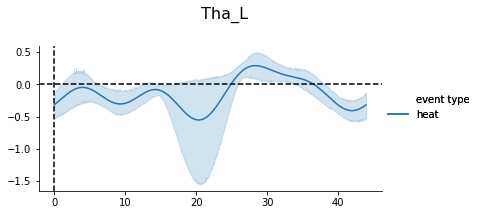

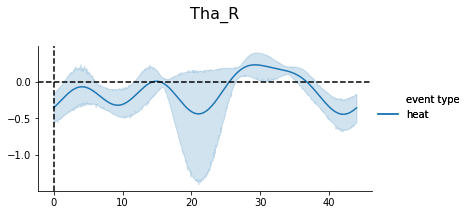

In [24]:
# We can plot the mean timecourse across subjects
g_model.plot_groupwise_timecourses()

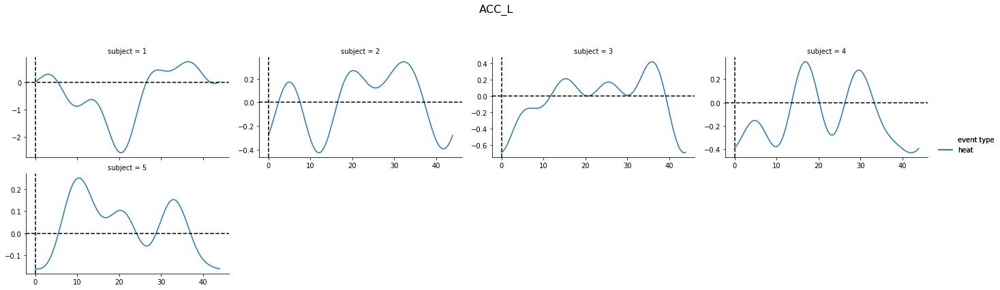

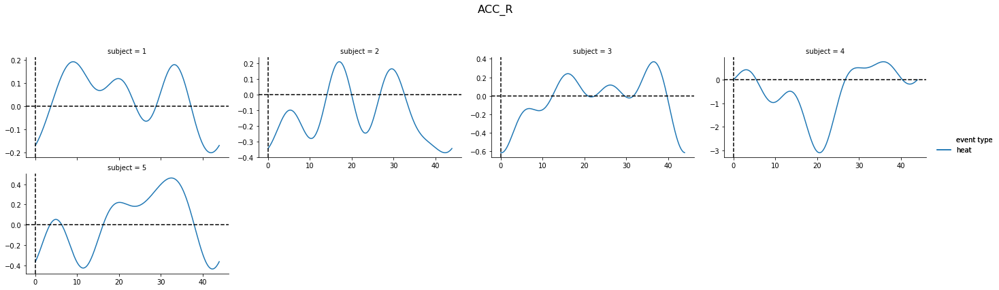

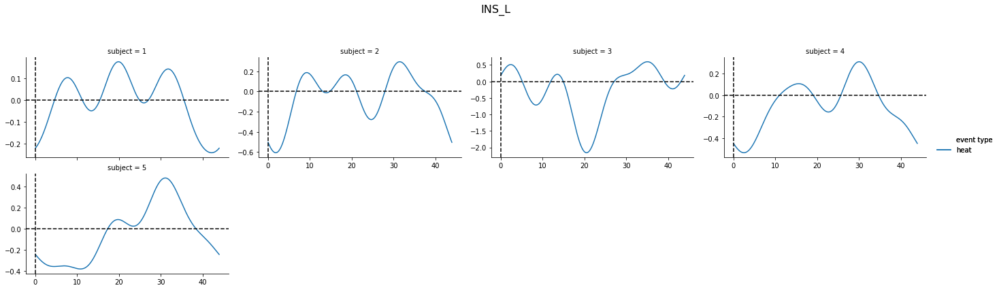

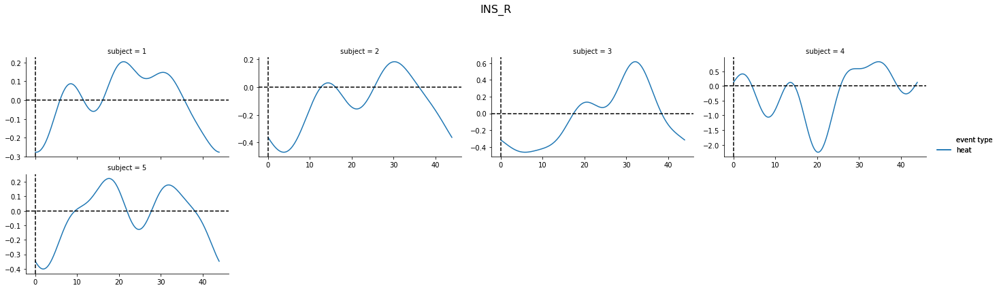

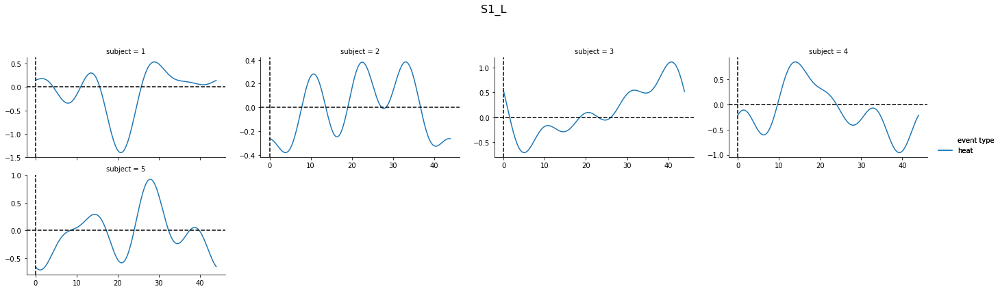

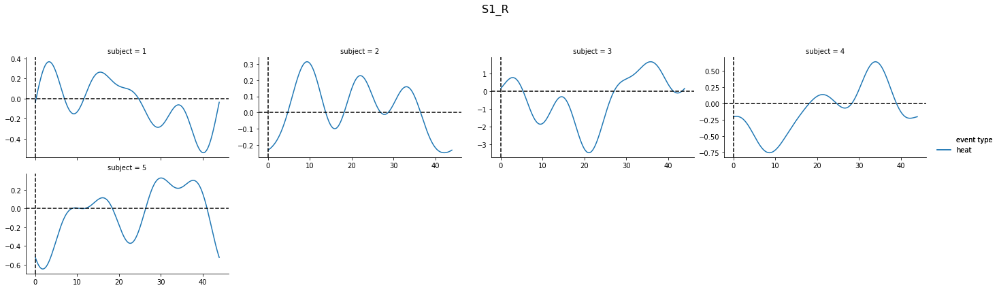

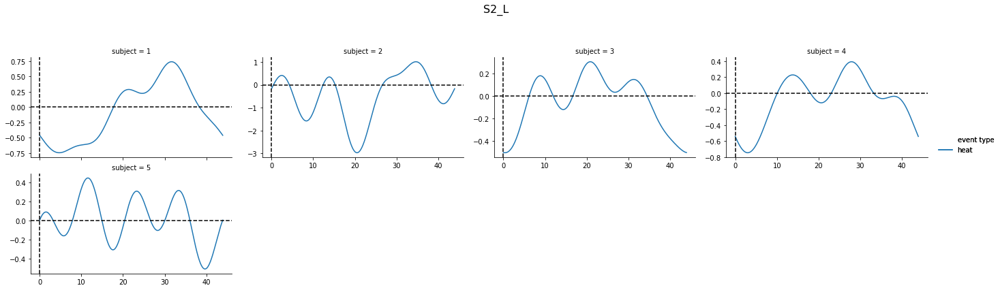

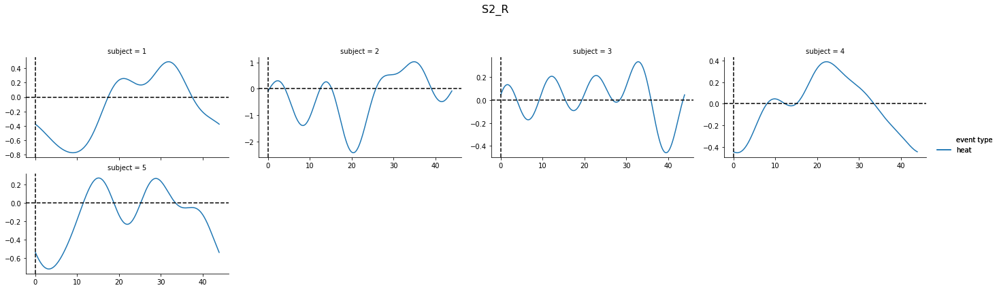

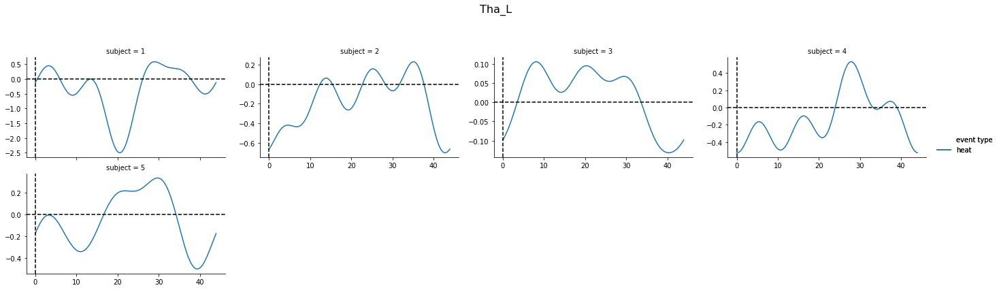

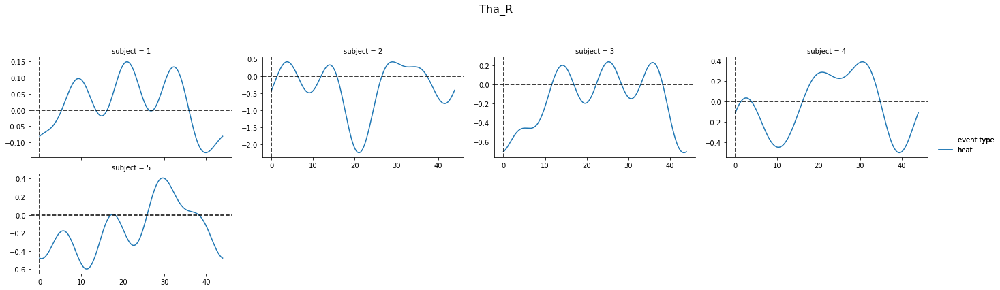

In [25]:
# As well as individual time courses
g_model.plot_subject_timecourses()

# with fmriprep?

In [13]:
from nilearn import datasets 
import nideconv as nd
import os
import pandas as pd
import numpy as np
from bids import BIDSLayout

# This makes sure I can import some of my own functions
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from linescanning.bin.utils.utils import bids_fullfile

In [14]:
fprep_dir = '/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep'
source_dir = '/mnt/d/FSL/shared/buff/pipeline_data/H01'

source_layout = BIDSLayout(source_dir, validate=False, index_metadata=True)
fmriprep_layout = BIDSLayout(fprep_dir, validate=False, index_metadata=True)
source_layout

TR = 2.21

In [15]:
from nideconv.utils.roi import get_fmriprep_timeseries

# here we can extract timeseries from fmriprep'ed data from the Harvard cortical atlas
cort_file = os.path.join(source_dir, 'code', 'tcs_harvard_cort_2mm.csv')

if not os.path.exists(cort_file):
    print(f"creating {cort_file}")
    harvard = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm', symmetric_split=True)

    ts_cort = get_fmriprep_timeseries(fprep_dir,
                                      source_dir,
                                      harvard)
    ts_cort.to_csv(cort_file)                                 
else:
    print(f"{cort_file} exists")
    ts_cort = pd.read_csv(cort_file)

/mnt/d/FSL/shared/buff/pipeline_data/H01/code/tcs_harvard_cort_2mm.csv exists


In [16]:
# here we can extract timeseries from fmriprep'ed data from the Pauli Subcortical Atlas
sub_file = os.path.join(source_dir, 'code', 'tcs_pauli_subcortex.csv')

if not os.path.exists(sub_file):
    print(f"creating {sub_file}")
    pauli = datasets.fetch_atlas_pauli_2017()

    ts_sub = get_fmriprep_timeseries(fprep_dir,
                                      source_dir,
                                      pauli)
    sub_file.to_csv(sub_file)                                 
else:
    print(f"{sub_file} exists")
    ts_sub = pd.read_csv(sub_file)

/mnt/d/FSL/shared/buff/pipeline_data/H01/code/tcs_pauli_subcortex.csv exists


In [17]:
# need this for to get the timeseries indexed per subject
subj_col = []
for i in np.arange(1,6):
    col = [i]*220
    subj_col.extend(col)

In [18]:
# Add subject index and check if dataframe looks alright
ts_cort.reset_index()
ts_cort['subject'] = subj_col
ts_cort.head()

,time,Left Frontal Pole,Right Frontal Pole,Left Insular Cortex,Right Insular Cortex,Left Superior Frontal Gyrus,Right Superior Frontal Gyrus,Left Middle Frontal Gyrus,Right Middle Frontal Gyrus,"Left Inferior Frontal Gyrus, pars triangularis",...,Right Planum Polare,Left Heschl's Gyrus (includes H1 and H2),Right Heschl's Gyrus (includes H1 and H2),Left Planum Temporale,Right Planum Temporale,Left Supracalcarine Cortex,Right Supracalcarine Cortex,Left Occipital Pole,Right Occipital Pole,subject
0,0.00,-0.020487,-0.025131,-0.022870,-0.021610,-0.008134,-0.043752,-0.014788,-0.010744,-0.015123,...,0.006942,-0.001460,0.000197,-0.016566,-0.018171,-0.036459,-0.042149,-0.005985,-0.138536,1
1,2.21,-0.306213,-0.410201,-0.254838,-0.205878,-0.277928,-0.258334,-0.289851,-0.172232,-0.493372,...,-0.103471,-0.069952,0.159450,-0.154342,-0.122330,-0.164312,-0.250455,2.563065,-1.343153,1
2,4.42,-0.421154,-0.618618,-0.307473,-0.251831,-0.267322,-0.431771,-0.278396,-0.377185,-0.542929,...,0.074686,0.484964,0.142714,0.217180,0.052149,-0.330018,-0.511918,-0.175603,-1.696829,1
3,6.63,-0.136752,-0.564832,-0.101342,-0.052182,-0.187154,-0.561411,-0.352607,-0.694551,-0.522409,...,0.640325,0.543194,0.453469,0.250856,0.685632,-0.340924,-0.347607,-0.348219,-1.136190,1
4,8.84,-0.633720,-0.818197,-0.188141,-0.157155,-0.409432,-0.462198,-0.588917,-0.433112,-1.047687,...,0.563386,0.149816,0.339224,0.202193,0.379832,0.246540,-0.165780,0.696402,-0.846804,1


In [19]:
# This is so we know which labels we can call
atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm', symmetric_split=True)
atlas.labels


Dataset created in /home/gjheij/nilearn_data/fsl

Downloaded 25716861 of 25716861 bytes (100.0%,    0.0s remaining) ...done. (31 seconds, 0 min)
Extracting data from /home/gjheij/nilearn_data/fsl/6d8c3ed01531407a4aeeb1364cf1778c/HarvardOxford.tgz..... done.


['Background',
 'Left Frontal Pole',
 'Right Frontal Pole',
 'Left Insular Cortex',
 'Right Insular Cortex',
 'Left Superior Frontal Gyrus',
 'Right Superior Frontal Gyrus',
 'Left Middle Frontal Gyrus',
 'Right Middle Frontal Gyrus',
 'Left Inferior Frontal Gyrus, pars triangularis',
 'Right Inferior Frontal Gyrus, pars triangularis',
 'Left Inferior Frontal Gyrus, pars opercularis',
 'Right Inferior Frontal Gyrus, pars opercularis',
 'Left Precentral Gyrus',
 'Right Precentral Gyrus',
 'Left Temporal Pole',
 'Right Temporal Pole',
 'Left Superior Temporal Gyrus, anterior division',
 'Right Superior Temporal Gyrus, anterior division',
 'Left Superior Temporal Gyrus, posterior division',
 'Right Superior Temporal Gyrus, posterior division',
 'Left Middle Temporal Gyrus, anterior division',
 'Right Middle Temporal Gyrus, anterior division',
 'Left Middle Temporal Gyrus, posterior division',
 'Right Middle Temporal Gyrus, posterior division',
 'Left Middle Temporal Gyrus, temporooccipita

In [20]:
# Also add subject index to subcortex dataframe
ts_sub['subject'] = subj_col

In [21]:
# Select our ROIs (except thalamus; not included in cortical atlas)
rois = ['Left Insular Cortex', 
        'Right Insular Cortex', 
        'Left Cingulate Gyrus, anterior division', 
        'Right Cingulate Gyrus, anterior division',
        'Left Postcentral Gyrus',
        'Right Postcentral Gyrus',
        'Left Parietal Operculum Cortex',
        'Right Parietal Operculum Cortex']

In [25]:
# make a dataframe of our selected ROIs
reduced = []
for i in rois:
    df = ts_cort[i]
    reduced.append(df)

In [30]:
no_pain_df = ts_cort[ts_cort.columns.drop(rois)]
no_pain_df

,time,Left Frontal Pole,Right Frontal Pole,Left Superior Frontal Gyrus,Right Superior Frontal Gyrus,Left Middle Frontal Gyrus,Right Middle Frontal Gyrus,"Left Inferior Frontal Gyrus, pars triangularis","Right Inferior Frontal Gyrus, pars triangularis","Left Inferior Frontal Gyrus, pars opercularis",...,Right Planum Polare,Left Heschl's Gyrus (includes H1 and H2),Right Heschl's Gyrus (includes H1 and H2),Left Planum Temporale,Right Planum Temporale,Left Supracalcarine Cortex,Right Supracalcarine Cortex,Left Occipital Pole,Right Occipital Pole,subject
0,0.00,-0.020487,-0.025131,-0.008134,-0.043752,-0.014788,-0.010744,-0.015123,-0.027341,-0.035001,...,0.006942,-0.001460,0.000197,-0.016566,-0.018171,-0.036459,-0.042149,-0.005985,-0.138536,1
1,2.21,-0.306213,-0.410201,-0.277928,-0.258334,-0.289851,-0.172232,-0.493372,-0.450133,-0.418844,...,-0.103471,-0.069952,0.159450,-0.154342,-0.122330,-0.164312,-0.250455,2.563065,-1.343153,1
2,4.42,-0.421154,-0.618618,-0.267322,-0.431771,-0.278396,-0.377185,-0.542929,-0.348192,-0.550385,...,0.074686,0.484964,0.142714,0.217180,0.052149,-0.330018,-0.511918,-0.175603,-1.696829,1
3,6.63,-0.136752,-0.564832,-0.187154,-0.561411,-0.352607,-0.694551,-0.522409,-0.672598,-0.157642,...,0.640325,0.543194,0.453469,0.250856,0.685632,-0.340924,-0.347607,-0.348219,-1.136190,1
4,8.84,-0.633720,-0.818197,-0.409432,-0.462198,-0.588917,-0.433112,-1.047687,-0.217392,0.195083,...,0.563386,0.149816,0.339224,0.202193,0.379832,0.246540,-0.165780,0.696402,-0.846804,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,475.15,-1.965653,-1.614872,-0.161758,-0.071896,-1.284493,-1.315092,-1.028176,0.214640,-0.793967,...,-0.921060,0.047800,-0.129803,-0.654061,-0.341559,-0.812657,-0.821918,-2.758770,-3.331435,5
1096,477.36,-1.500052,-0.698444,0.402249,0.331449,-0.870325,-0.729269,-0.008958,0.801510,0.028807,...,-0.360383,0.349674,0.383380,0.295441,0.281809,-0.357227,-0.654553,-2.121396,-3.146070,5
1097,479.57,0.126028,0.746728,-0.728065,0.820009,-0.029873,0.750534,0.902312,1.591185,0.569879,...,0.800608,1.488923,1.048306,1.976525,1.064467,0.589793,-0.136589,-1.282726,-2.003915,5
1098,481.78,-0.712699,0.676418,0.945951,0.456233,0.434534,0.904423,0.994497,1.275823,0.726550,...,0.751898,1.174397,1.142880,1.369366,1.055616,0.096400,0.111761,-0.305510,-0.600317,5


In [83]:
# Make list of TR-times
time = np.array(list(TR*np.arange(220))*5)

In [37]:
pain_df = pd.DataFrame(reduced).T
pain_df.head()

reorder_df = pd.concat([pain_df, no_pain_df])
reorder_df.head()

,Left Insular Cortex,Right Insular Cortex,"Left Cingulate Gyrus, anterior division","Right Cingulate Gyrus, anterior division",Left Postcentral Gyrus,Right Postcentral Gyrus,Left Parietal Operculum Cortex,Right Parietal Operculum Cortex,time,Left Frontal Pole,...,Right Planum Polare,Left Heschl's Gyrus (includes H1 and H2),Right Heschl's Gyrus (includes H1 and H2),Left Planum Temporale,Right Planum Temporale,Left Supracalcarine Cortex,Right Supracalcarine Cortex,Left Occipital Pole,Right Occipital Pole,subject
0,-0.022870,-0.021610,-0.039009,-0.041381,-0.049448,-0.032836,-0.073573,-0.044955,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.254838,-0.205878,-0.478373,-0.307627,-0.181972,-0.322396,-0.290772,0.049227,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.307473,-0.251831,-0.498876,-0.295823,-0.091756,-0.025294,0.000679,0.411439,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-0.101342,-0.052182,-0.525142,-0.351168,0.078338,0.339329,0.243428,0.174728,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.188141,-0.157155,-0.555919,-0.486247,-0.067912,0.038397,0.577634,0.239442,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
# Do some indexing
red = pd.DataFrame(reduced).T
red['t'] = time
red['subject'] = subj_col
red.set_index(['subject', 't'])

Left Insular Cortex  Right Insular Cortex  \
subject t                                                   
1       0.00              -0.022870             -0.021610   
        2.21              -0.254838             -0.205878   
        4.42              -0.307473             -0.251831   
        6.63              -0.101342             -0.052182   
        8.84              -0.188141             -0.157155   
...                             ...                   ...   
5       475.15            -0.187392             -0.019592   
        477.36             0.326689              0.813565   
        479.57             1.247910              1.904364   
        481.78             0.855852              1.361421   
        483.99             0.059422              0.100930   

                Left Cingulate Gyrus, anterior division  \
subject t                                                 
1       0.00                                  -0.039009   
        2.21                                  -0.478373   
        4.42                                  -0.498876   
        6.63                                  -0.525142   
        8.84                                  -0.555919   
...                                                 ...   
5       475.15                                -1.036380   
        477.36                                -0.595805   
        479.57                                 0.861887   
        481.78                                 1.208966   
        483.99                                 0.035695   

                Right Cingulate Gyrus, anterior division  \
subject t                                                  
1       0.00                                   -0.041381   
        2.21                                   -0.307627   
        4.42                                   -0.295823   
        6.63                                   -0.351168   
        8.84                                   -0.486247   
...                                                  ...   
5       475.15                                 -1.039175   
        477.36                                 -0.401093   
        479.57                                  0.544606   
        481.78                                  0.754609   
        483.99                                  0.031601   

                Left Postcentral Gyrus  Right Postcentral Gyrus  \
subject t                                                         
1       0.00                 -0.049448                -0.032836   
        2.21                 -0.181972                -0.322396   
        4.42                 -0.091756                -0.025294   
        6.63                  0.078338                 0.339329   
        8.84                 -0.067912                 0.038397   
...                                ...                      ...   
5       475.15               -0.648792                -0.534701   
        477.36               -0.022976                 0.204978   
        479.57                1.024131                 1.326230   
        481.78                0.742441                 0.822743   
        483.99                0.046267                 0.034425   

                Left Parietal Operculum Cortex  \
subject t                                        
1       0.00                         -0.073573   
        2.21                         -0.290772   
        4.42                          0.000679   
        6.63                          0.243428   
        8.84                          0.577634   
...                                        ...   
5       475.15                       -0.806626   
        477.36                        0.073224   
        479.57                        1.971078   
        481.78                        2.341702   
        483.99                        0.123059   

                Right Parietal Operculum Cortex  
subject t                                        
1       0.00                          -0.044955  


In [92]:
# We can now use GroupResponseFitter to fit all the subjects with one object
g_model = nd.GroupResponseFitter(red,
                                 data_onsets,
                                 input_sample_rate=1,
                                 concatenate_runs=False)

# We use the add_event-method to add the events we are interested in. The GroupResponseFitter then automatically collects the right onset times from the onsets-object. We choose here to use the Fourier-basis set, with 5 regressors.
g_model.add_event('heat',
                  basis_set='fourier',
                  n_regressors=4,
                  interval=[0, 10])

In [94]:
# We can fit all the subjects at once using the fit-method
g_model.fit()

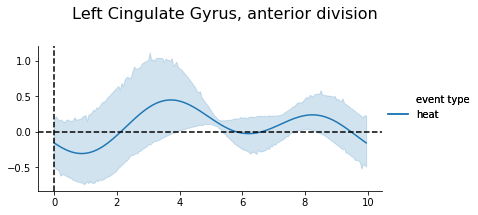

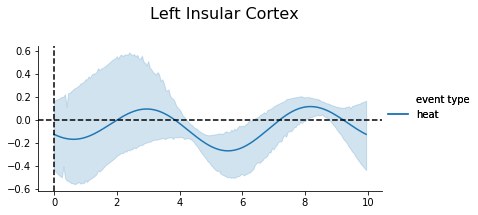

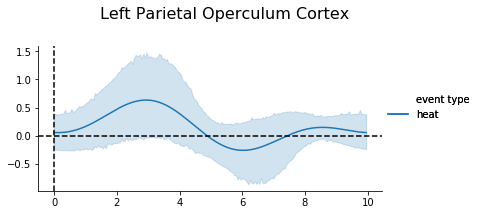

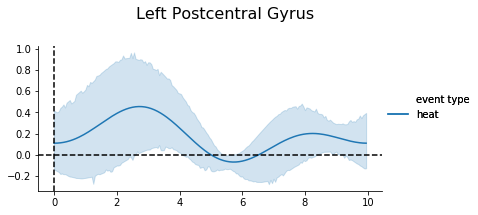

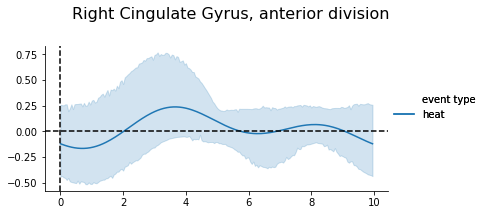

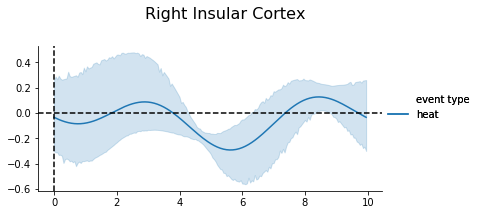

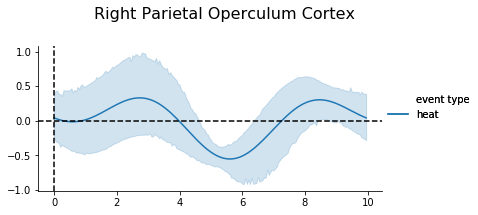

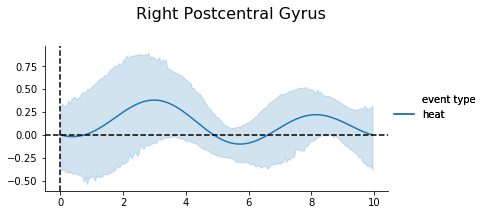

In [95]:
# We can plot the mean timecourse across subjects
g_model.plot_groupwise_timecourses()

## Try some connectivity stuff?

In [30]:
harvard = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')
harvard_filename = harvard.maps
labels = harvard.labels
labels

['Background',
 'Frontal Pole',
 'Insular Cortex',
 'Superior Frontal Gyrus',
 'Middle Frontal Gyrus',
 'Inferior Frontal Gyrus, pars triangularis',
 'Inferior Frontal Gyrus, pars opercularis',
 'Precentral Gyrus',
 'Temporal Pole',
 'Superior Temporal Gyrus, anterior division',
 'Superior Temporal Gyrus, posterior division',
 'Middle Temporal Gyrus, anterior division',
 'Middle Temporal Gyrus, posterior division',
 'Middle Temporal Gyrus, temporooccipital part',
 'Inferior Temporal Gyrus, anterior division',
 'Inferior Temporal Gyrus, posterior division',
 'Inferior Temporal Gyrus, temporooccipital part',
 'Postcentral Gyrus',
 'Superior Parietal Lobule',
 'Supramarginal Gyrus, anterior division',
 'Supramarginal Gyrus, posterior division',
 'Angular Gyrus',
 'Lateral Occipital Cortex, superior division',
 'Lateral Occipital Cortex, inferior division',
 'Intracalcarine Cortex',
 'Frontal Medial Cortex',
 'Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex)',
 'Subcallo

In [18]:
data = fmriprep_layout.get(suffix='bold', extension='nii.gz')
fname = bids_fullfile(data[0])
print(fname)

conf = fmriprep_layout.get(suffix='regressors', extension='tsv')
print(conf)

/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-001/func/sub-001_task-heat_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz
[<BIDSDataFile filename='/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-001/func/sub-001_task-heat_desc-confounds_regressors.tsv'>, <BIDSDataFile filename='/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-002/func/sub-002_task-heat_desc-confounds_regressors.tsv'>, <BIDSDataFile filename='/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-003/func/sub-003_task-heat_desc-confounds_regressors.tsv'>, <BIDSDataFile filename='/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-004/func/sub-004_task-heat_desc-confounds_regressors.tsv'>, <BIDSDataFile filename='/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-005/func/sub-005_task-heat_desc-confounds_regressors.tsv'>]


In [19]:
cname = bids_fullfile(conf[0])
print(cname)

/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-001/func/sub-001_task-heat_desc-confounds_regressors.tsv


In [20]:
# Remove NaNs
c_no_nan = cname.split('.')[0]+'_no_nan.tsv'

if not os.path.exists(c_no_nan):
    if pd.read_table(cname).isnull().values.any() == True:
        c = pd.read_table(cname).fillna(0)
        c.to_csv(os.path.join(os.path.dirname(cname), cname.split('.')[0]+'_no_nan.tsv'), sep='\t')
    else:
        conf = cname
else:
    print(f"{c_no_nan} exists")
    conf = c_no_nan

/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-001/func/sub-001_task-heat_desc-confounds_regressors_no_nan.tsv exists


In [21]:
from nilearn.input_data import NiftiLabelsMasker
masker = NiftiLabelsMasker(labels_img=harvard_filename, standardize=True,
                           memory='nilearn_cache', verbose=5)

In [22]:
# Here we go from nifti files to the signal time series in a numpy
# array. Note how we give confounds to be regressed out during signal
# extraction
time_series = masker.fit_transform(fname, confounds=conf)

[NiftiLabelsMasker.fit_transform] loading data from /home/gjheij/nilearn_data/fsl/data/atlases/HarvardOxford/HarvardOxford-cort-maxprob-thr25-2mm.nii.gz
Resampling labels
________________________________________________________________________________
[Memory] Calling nilearn.input_data.base_masker.filter_and_extract...
filter_and_extract('/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-001/func/sub-001_task-heat_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz', 
{ 'background_label': 0,
  'detrend': False,
  'dtype': None,
  'high_pass': None,
  'labels_img': '/home/gjheij/nilearn_data/fsl/data/atlases/HarvardOxford/HarvardOxford-cort-maxprob-thr25-2mm.nii.gz',
  'low_pass': None,
  'mask_img': None,
  'smoothing_fwhm': None,
  'standardize': True,
  'strategy': 'mean',
  't_r': None,
  'target_affine': None,
  'target_shape': None}, confounds='/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-001/func/sub-001_task-heat_desc-confounds_regress

In [37]:
tc_df = pd.DataFrame((time_series), columns=labels[1:])
tc_df.head()

,Frontal Pole,Insular Cortex,Superior Frontal Gyrus,Middle Frontal Gyrus,"Inferior Frontal Gyrus, pars triangularis","Inferior Frontal Gyrus, pars opercularis",Precentral Gyrus,Temporal Pole,"Superior Temporal Gyrus, anterior division","Superior Temporal Gyrus, posterior division",...,Temporal Occipital Fusiform Cortex,Occipital Fusiform Gyrus,Frontal Operculum Cortex,Central Opercular Cortex,Parietal Operculum Cortex,Planum Polare,Heschl's Gyrus (includes H1 and H2),Planum Temporale,Supracalcarine Cortex,Occipital Pole
0,0.576707,0.033831,-0.285691,-0.353822,-0.034880,-0.359269,-0.354557,0.663384,0.126870,-0.066156,...,0.429489,0.034746,0.029199,-0.119993,-0.445950,0.116849,0.221401,0.121184,-0.032998,0.030533
1,-0.409372,-0.398894,0.124570,0.257294,0.131936,0.185829,0.333700,0.527874,-0.357704,-0.332393,...,-0.404838,-0.308809,-0.404838,0.129049,0.493641,-0.345503,-0.259905,-0.363553,0.050445,-0.313939
2,-1.395451,-1.177798,-1.106214,-1.194107,-1.202587,-1.215852,-1.195760,-1.369269,-1.326852,-1.131103,...,-1.552038,-1.081806,-1.186103,-1.199172,-1.228942,-1.177736,-1.318777,-1.333027,-1.201203,-1.175119
3,-1.395451,-1.350888,-1.024162,-1.194107,-1.202587,-0.904368,-1.119287,-0.691718,-0.842278,-1.219848,...,-0.926293,-1.339472,-1.446525,-1.199172,-1.307241,-0.992795,-0.837472,-0.848290,-1.201203,-1.433473
4,1.453221,0.639646,0.616884,0.944800,0.632382,1.042412,0.945485,1.069915,1.386763,1.087537,...,1.472398,0.635966,0.810465,0.627132,0.963436,1.318963,1.376534,1.381500,0.634548,0.547241


In [38]:
rois = ['Insular Cortex', 
        'Cingulate Gyrus, anterior division',
        'Postcentral Gyrus',
        'Parietal Operculum Cortex']

In [42]:
pain_df = tc_df[rois]
pain_df.head()

,Insular Cortex,"Cingulate Gyrus, anterior division",Postcentral Gyrus,Parietal Operculum Cortex
0,0.033831,-0.062474,0.795663,-0.445950
1,-0.398894,-0.326790,0.635804,0.493641
2,-1.177798,-1.031630,-1.122648,-1.228942
3,-1.350888,-1.295945,-0.802930,-1.307241
4,0.639646,1.082891,-0.003633,0.963436


In [43]:
no_pain_df = tc_df[tc_df.columns.drop(rois)]
no_pain_df.head()

,Frontal Pole,Superior Frontal Gyrus,Middle Frontal Gyrus,"Inferior Frontal Gyrus, pars triangularis","Inferior Frontal Gyrus, pars opercularis",Precentral Gyrus,Temporal Pole,"Superior Temporal Gyrus, anterior division","Superior Temporal Gyrus, posterior division","Middle Temporal Gyrus, anterior division",...,"Temporal Fusiform Cortex, posterior division",Temporal Occipital Fusiform Cortex,Occipital Fusiform Gyrus,Frontal Operculum Cortex,Central Opercular Cortex,Planum Polare,Heschl's Gyrus (includes H1 and H2),Planum Temporale,Supracalcarine Cortex,Occipital Pole
0,0.576707,-0.285691,-0.353822,-0.034880,-0.359269,-0.354557,0.663384,0.126870,-0.066156,0.756469,...,-0.199711,0.429489,0.034746,0.029199,-0.119993,0.116849,0.221401,0.121184,-0.032998,0.030533
1,-0.409372,0.124570,0.257294,0.131936,0.185829,0.333700,0.527874,-0.357704,-0.332393,0.298843,...,0.127562,-0.404838,-0.308809,-0.404838,0.129049,-0.345503,-0.259905,-0.363553,0.050445,-0.313939
2,-1.395451,-1.106214,-1.194107,-1.202587,-1.215852,-1.195760,-1.369269,-1.326852,-1.131103,-0.921491,...,-1.099710,-1.552038,-1.081806,-1.186103,-1.199172,-1.177736,-1.318777,-1.333027,-1.201203,-1.175119
3,-1.395451,-1.024162,-1.194107,-1.202587,-0.904368,-1.119287,-0.691718,-0.842278,-1.219848,-0.768950,...,-1.017892,-0.926293,-1.339472,-1.446525,-1.199172,-0.992795,-0.837472,-0.848290,-1.201203,-1.433473
4,1.453221,0.616884,0.944800,0.632382,1.042412,0.945485,1.069915,1.386763,1.087537,0.298843,...,0.618471,1.472398,0.635966,0.810465,0.627132,1.318963,1.376534,1.381500,0.634548,0.547241


In [65]:
reorder_df = pd.concat([pain_df, no_pain_df], axis=1)
new_labels = reorder_df.columns.to_list()
reorder_df.head()
time_series = reorder_df.to_numpy()


In [62]:
print(new_labels)

['Insular Cortex', 'Cingulate Gyrus, anterior division', 'Postcentral Gyrus', 'Parietal Operculum Cortex', 'Frontal Pole', 'Superior Frontal Gyrus', 'Middle Frontal Gyrus', 'Inferior Frontal Gyrus, pars triangularis', 'Inferior Frontal Gyrus, pars opercularis', 'Precentral Gyrus', 'Temporal Pole', 'Superior Temporal Gyrus, anterior division', 'Superior Temporal Gyrus, posterior division', 'Middle Temporal Gyrus, anterior division', 'Middle Temporal Gyrus, posterior division', 'Middle Temporal Gyrus, temporooccipital part', 'Inferior Temporal Gyrus, anterior division', 'Inferior Temporal Gyrus, posterior division', 'Inferior Temporal Gyrus, temporooccipital part', 'Superior Parietal Lobule', 'Supramarginal Gyrus, anterior division', 'Supramarginal Gyrus, posterior division', 'Angular Gyrus', 'Lateral Occipital Cortex, superior division', 'Lateral Occipital Cortex, inferior division', 'Intracalcarine Cortex', 'Frontal Medial Cortex', 'Juxtapositional Lobule Cortex (formerly Supplementary

## With confounds

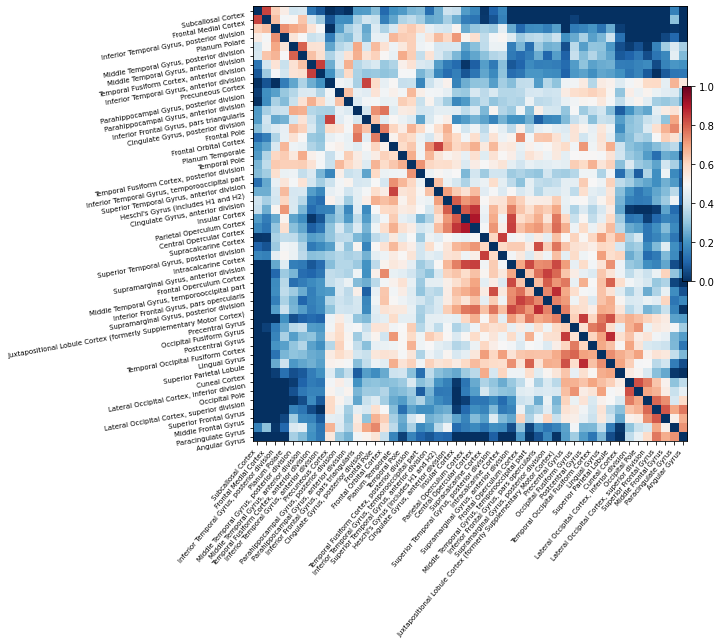

In [63]:
from nilearn.connectome import ConnectivityMeasure
correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrix = correlation_measure.fit_transform([time_series])[0]

# Plot the correlation matrix
import numpy as np
from nilearn import plotting
# Make a large figure
# Mask the main diagonal for visualization:
np.fill_diagonal(correlation_matrix, 0)
# The labels we have start with the background (0), hence we skip the
# first label
# matrices are ordered for block-like representation
plotting.plot_matrix(correlation_matrix, figure=(10, 8), labels=new_labels,
                     vmax=1, vmin=0, reorder=True)

## No confounds

[NiftiLabelsMasker.fit_transform] loading data from /home/gjheij/nilearn_data/fsl/data/atlases/HarvardOxford/HarvardOxford-cort-maxprob-thr25-2mm.nii.gz
________________________________________________________________________________
[Memory] Calling nilearn.input_data.base_masker.filter_and_extract...
filter_and_extract('/mnt/d/FSL/shared/buff/pipeline_data/H01/derivatives/fmriprep/sub-001/func/sub-001_task-heat_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz', 
{ 'background_label': 0,
  'detrend': False,
  'dtype': None,
  'high_pass': None,
  'labels_img': '/home/gjheij/nilearn_data/fsl/data/atlases/HarvardOxford/HarvardOxford-cort-maxprob-thr25-2mm.nii.gz',
  'low_pass': None,
  'mask_img': None,
  'smoothing_fwhm': None,
  'standardize': True,
  'strategy': 'mean',
  't_r': None,
  'target_affine': None,
  'target_shape': None}, confounds=None, dtype=None, memory=Memory(location=nilearn_cache/joblib), memory_level=1, verbose=5)
[NiftiLabelsMasker.transform_single_imgs] L

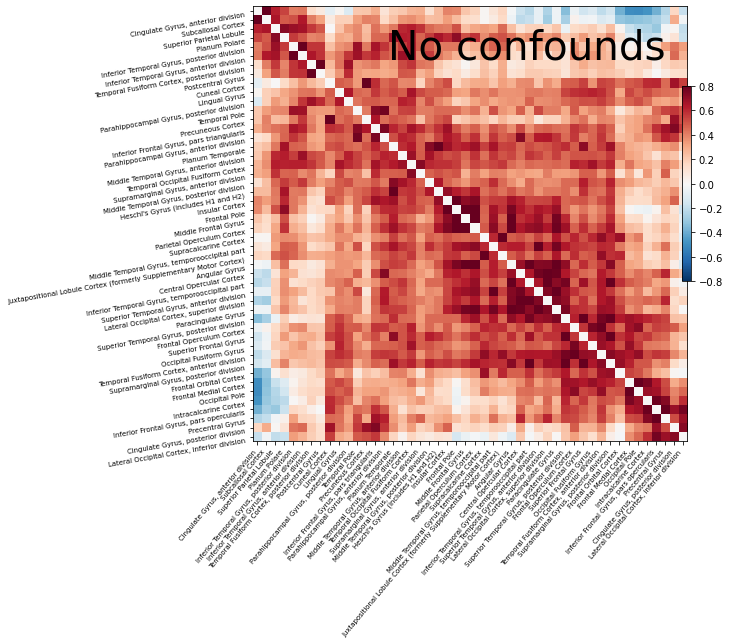

In [56]:
time_series = masker.fit_transform(fname)

rois = ['Insular Cortex', 
        'Cingulate Gyrus, anterior division',
        'Postcentral Gyrus',
        'Parietal Operculum Cortex']

# Create dataframe of timeseries
tc_df = pd.DataFrame((time_series), columns=labels[1:])
tc_df.head()

# Extract pain regions
pain_df = tc_df[rois]
pain_df.head()

# Drop pain regions from main dataframe
no_pain_df = tc_df[tc_df.columns.drop(rois)]
no_pain_df.head()

# Recombine dataframes with reordered data
reorder_df = pd.concat([pain_df, no_pain_df], axis=1)
reorder_df.head()

# Back to numpy array
time_series = reorder_df.to_numpy()

# Note how we did not specify confounds above. This is bad!

correlation_matrix = correlation_measure.fit_transform([time_series])[0]

# Mask the main diagonal for visualization:
np.fill_diagonal(correlation_matrix, 0)

plotting.plot_matrix(correlation_matrix, figure=(10, 8), labels=labels[1:],
                     vmax=0.8, vmin=-0.8, title='No confounds', reorder=True)

plotting.show()